Aim of this notebook is to look at calibrated stereo images and to visualize some mathematical properties of pairs of matched keypoints, found by opencv sift algorithms or our pysift implementation.


Imports


In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os
import sys

# add the path to the visualize_hessian folder
sys.path.append(os.path.join("..", "visualize_hessian"))

import visu_hessian as vh

# return to the root directory
sys.path.append(os.path.join(".."))

# add the path to the visualize_hessian folder
sys.path.append(os.path.join("..", "descriptor"))

import descriptor.descriptor as desc

# return to the root directory
sys.path.append(os.path.join(".."))

# Load grayscale image


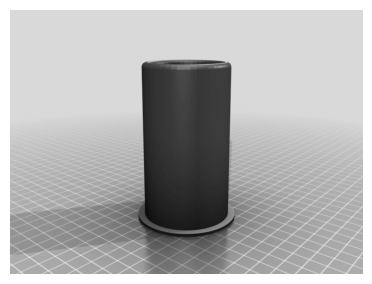

In [2]:
img_folder = "../data"
im_name1 = "blue_cylinder"
im_ext = "jpg"
im1 = cv.imread(f"{img_folder}/{im_name1}.{im_ext}", cv.IMREAD_GRAYSCALE)

# compute float32 versions for calculations
float_im1 = vh.convert_uint8_to_float32(im1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(im1, cmap="gray")
plt.axis("off")
plt.show()

# Match SIFT Keypoints on stereo setup


In [3]:
# Initiate SIFT detector
sift = cv.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(im1, None)

# print number of keypoints detected in each image
print(f"Number of keypoints detected in {im_name1}: {len(kp1)}")

Number of keypoints detected in blue_cylinder: 404


# Visualize gradients and curvatures


In [4]:
kp_img1 = kp1

Show SIFT keypoints


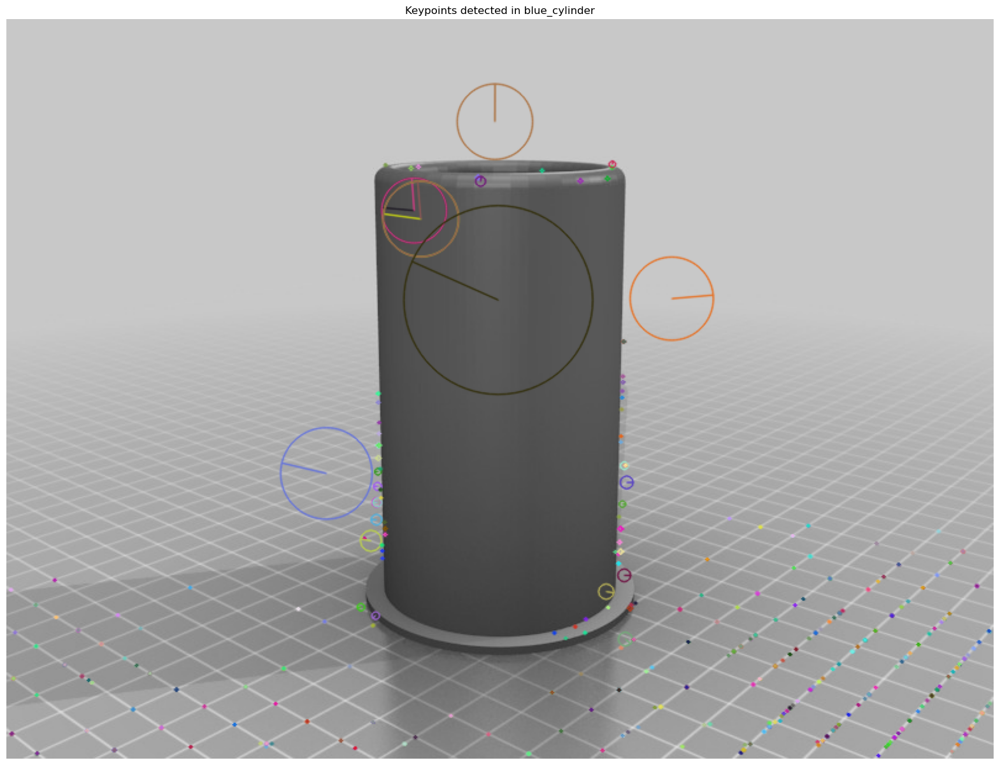

In [5]:
# show image 1 with keypoints
kp_img1_draw = cv.drawKeypoints(
    im1, kp_img1, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)
plt.figure(figsize=(20, 20))
plt.imshow(kp_img1_draw)
plt.axis("off")
plt.title(f"Keypoints detected in {im_name1}")
# save figure
# plt.savefig(f"{img_folder}/cubes_sift_kp1.png", dpi=600)
plt.show()

Show curvature values


In [6]:
zoom_radius = 50
# kp_index = 100
# kp_index = np.random.randint(0, len(kp_img1))
# kp1 = kp_img1[kp_index]

nb_selected_kp = 20
kp_indexes = np.random.randint(0, len(kp_img1), nb_selected_kp)
kps = [kp_img1[i] for i in kp_indexes]

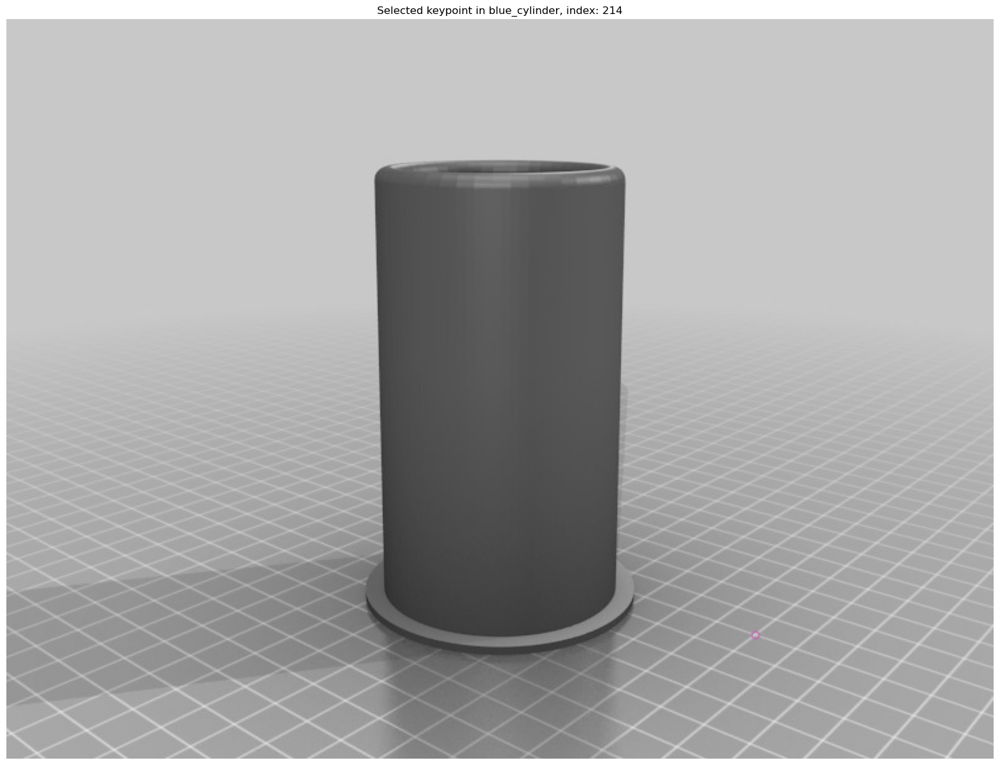

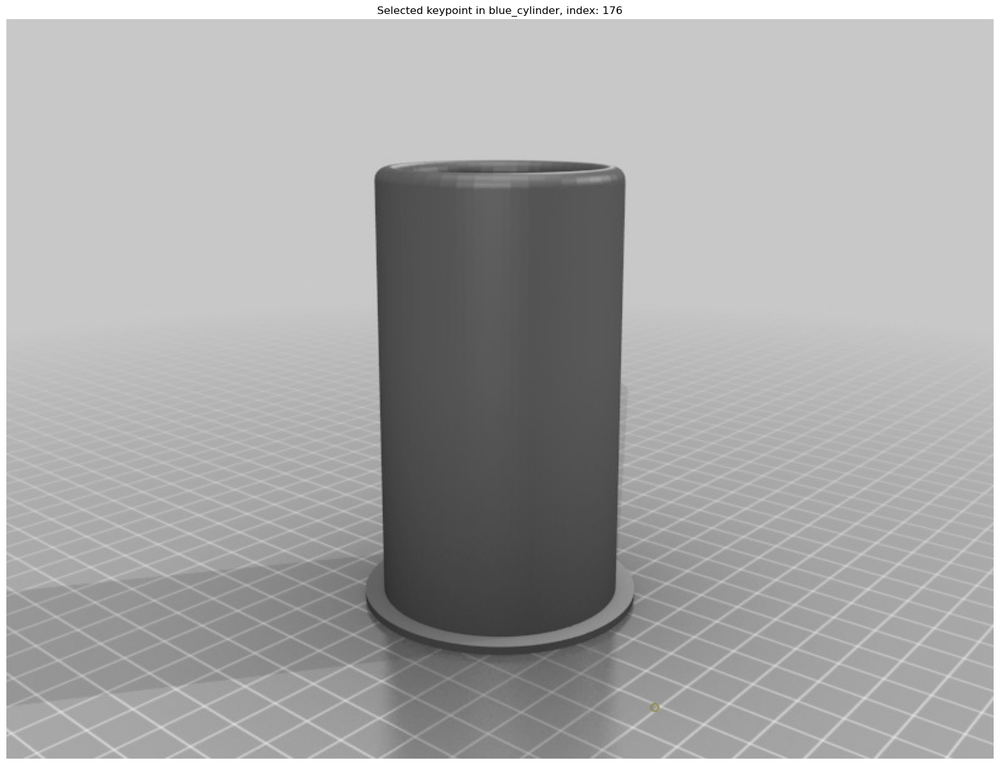

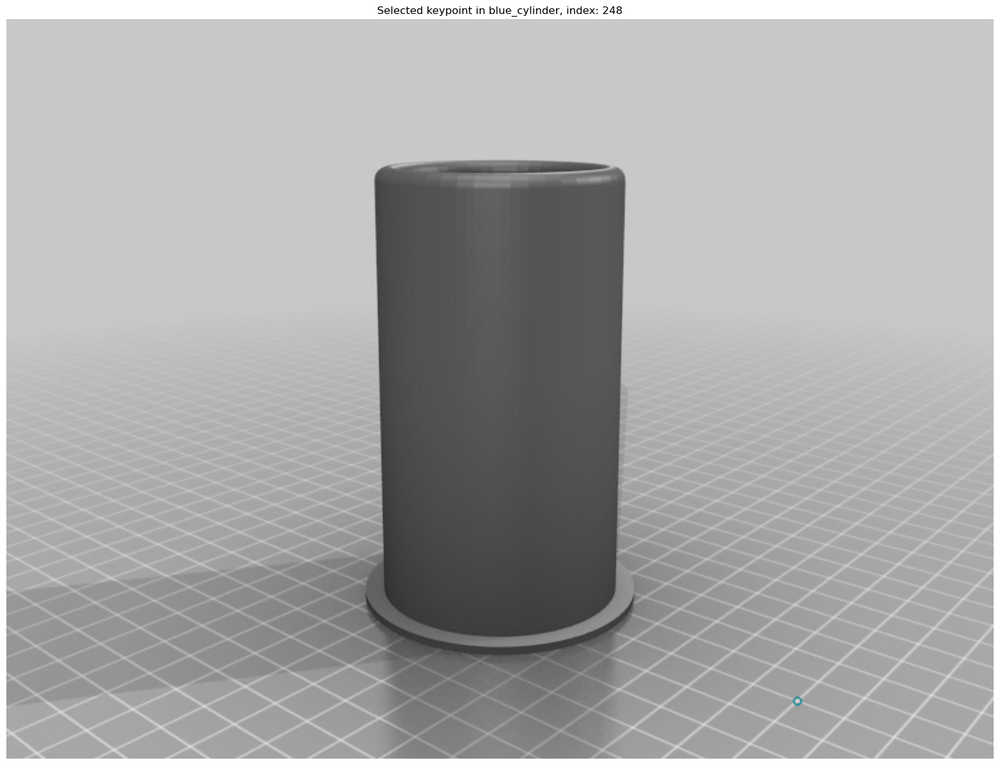

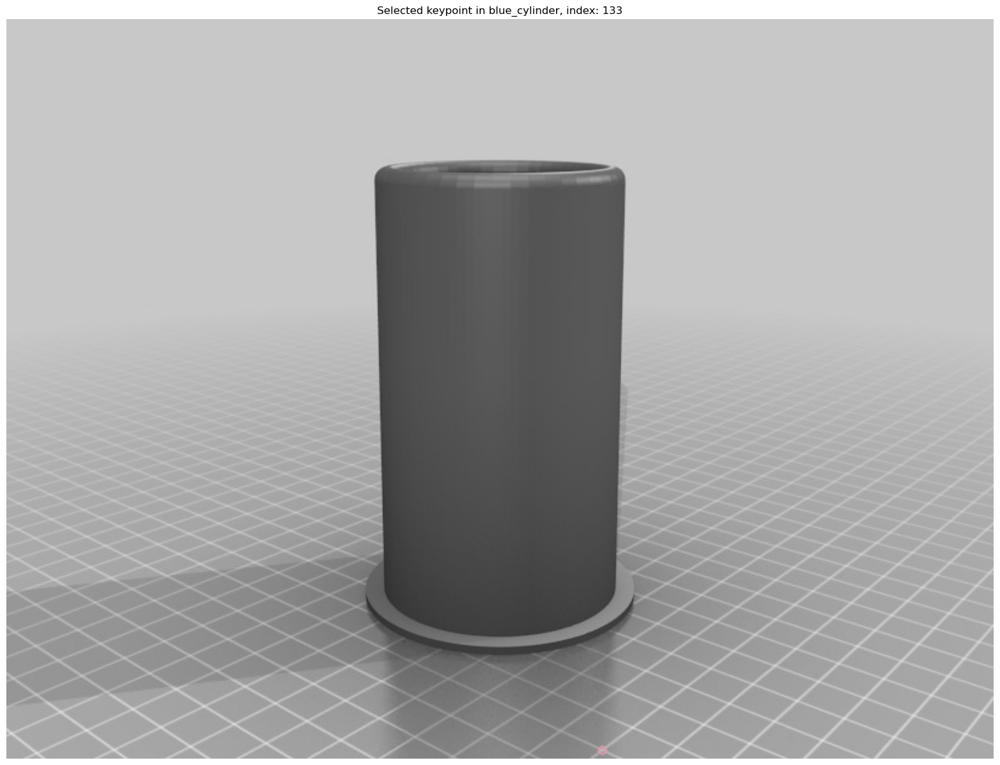

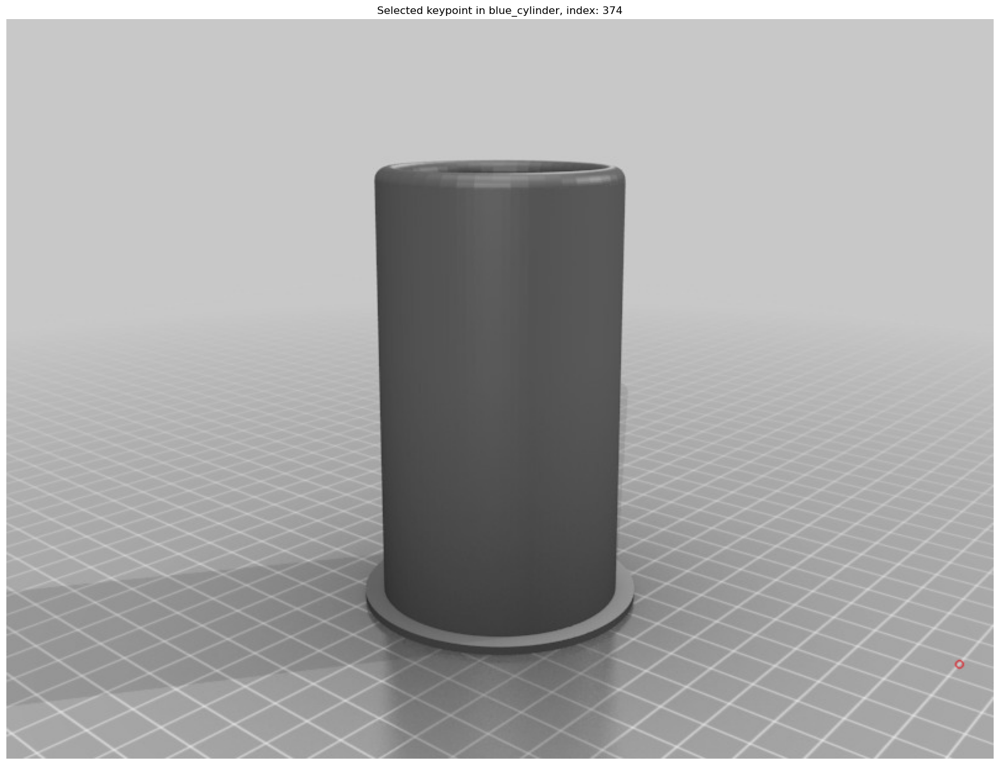

...

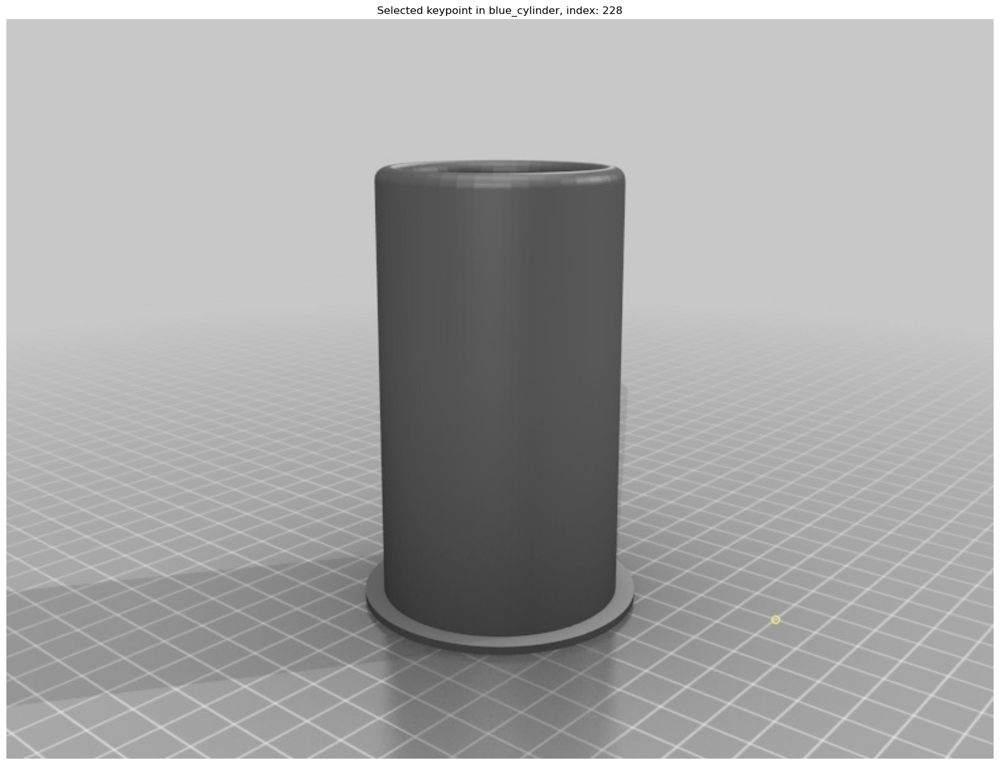

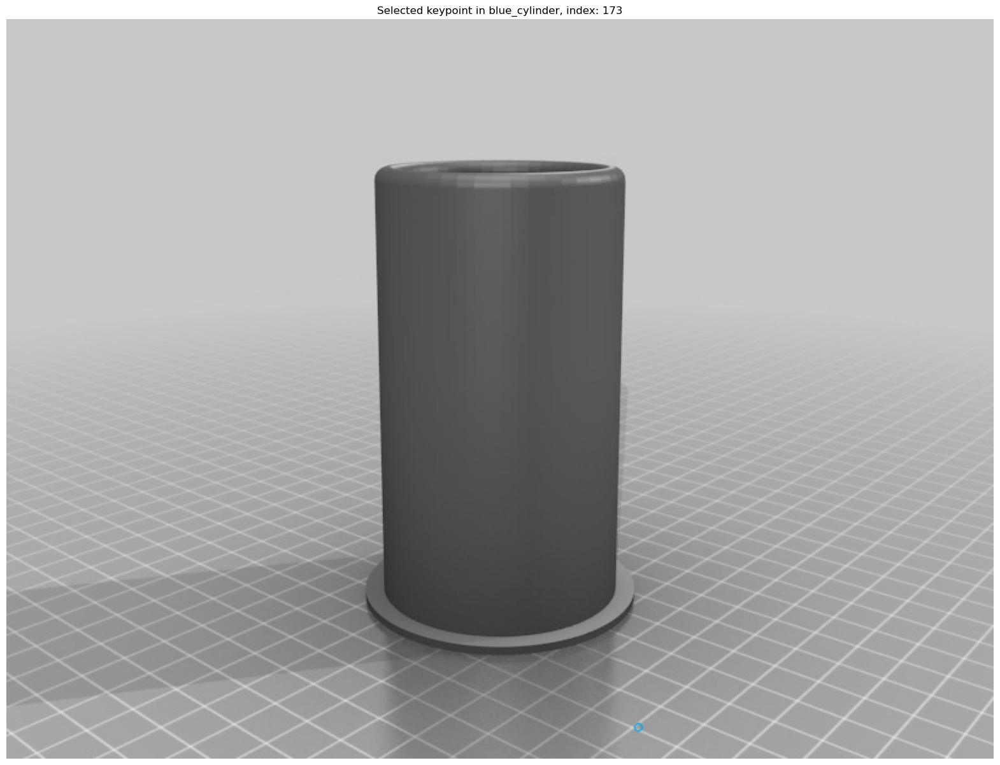

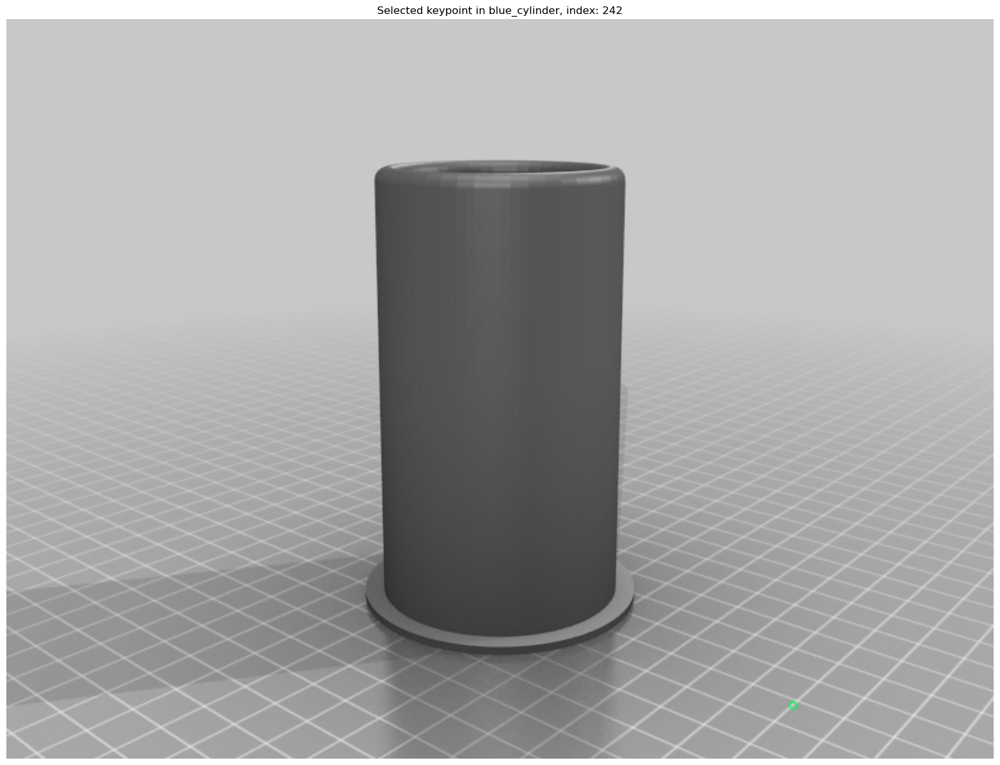

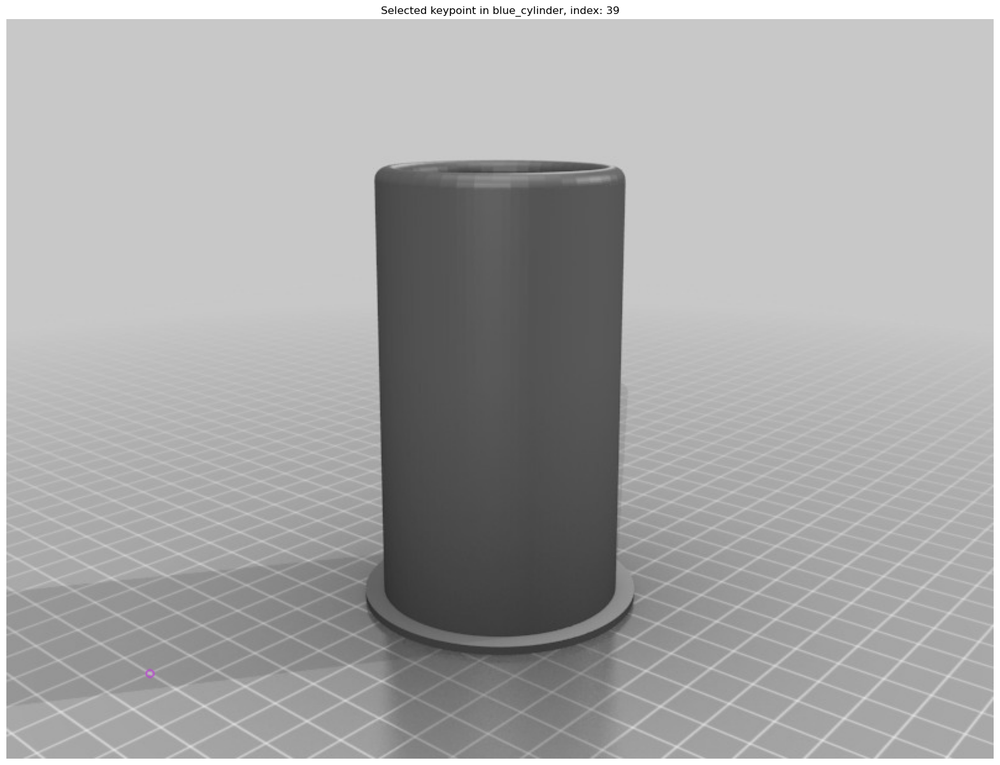

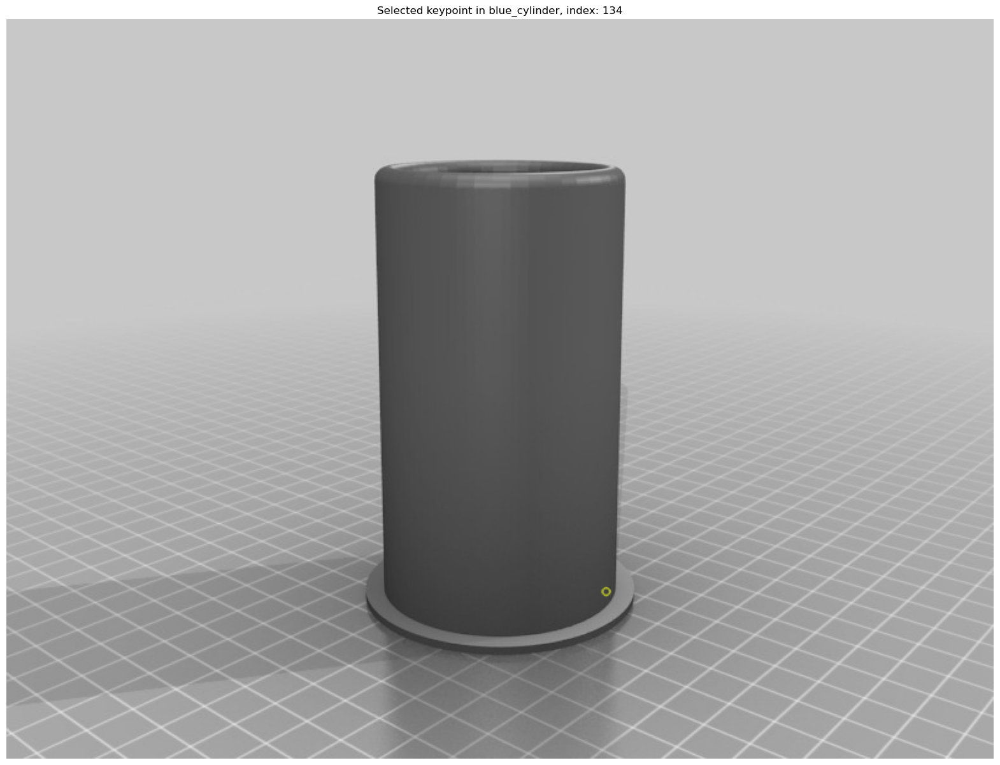

In [7]:
# draw single keypoint on image 0
for i in range(nb_selected_kp):
    kp_index = kp_indexes[i]
    kp1 = kps[i]

    kp_img1_draw_single = cv.drawKeypoints(im1, [kp1], None, flags=None)

    plt.figure(figsize=(20, 20))

    plt.imshow(kp_img1_draw_single)

    plt.axis("off")

    plt.title(f"Selected keypoint in {im_name1}, index: {kp_index}")

    # save figure

    plt.show()

# choose 1 keypoint
kp_index = 134
kp1 = kp_img1[kp_index]

kp_img1_draw_single = cv.drawKeypoints(im1, [kp1], None, flags=None)

plt.figure(figsize=(20, 20))

plt.imshow(kp_img1_draw_single)

plt.axis("off")

plt.title(f"Selected keypoint in {im_name1}, index: {kp_index}")

# save figure

plt.show()

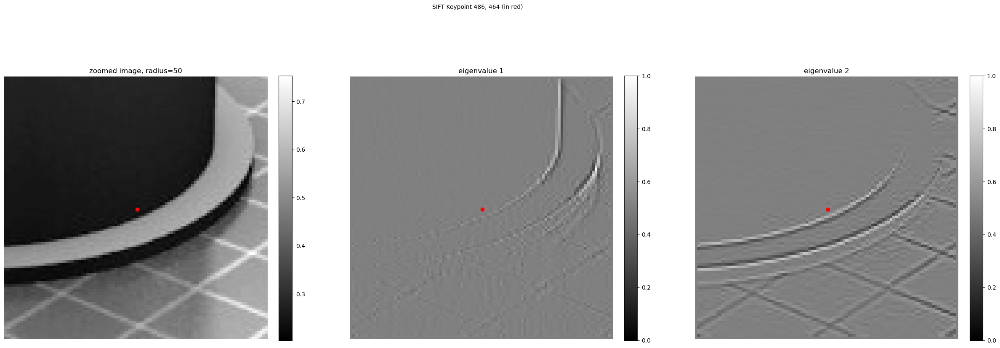

In [8]:
# display the figure of curvature values on the float versions
eigval_fig1 = vh.visualize_curvature_values(float_im1, kp1, zoom_radius)
plt.figure(eigval_fig1.number)
plt.show()

Display principal directions


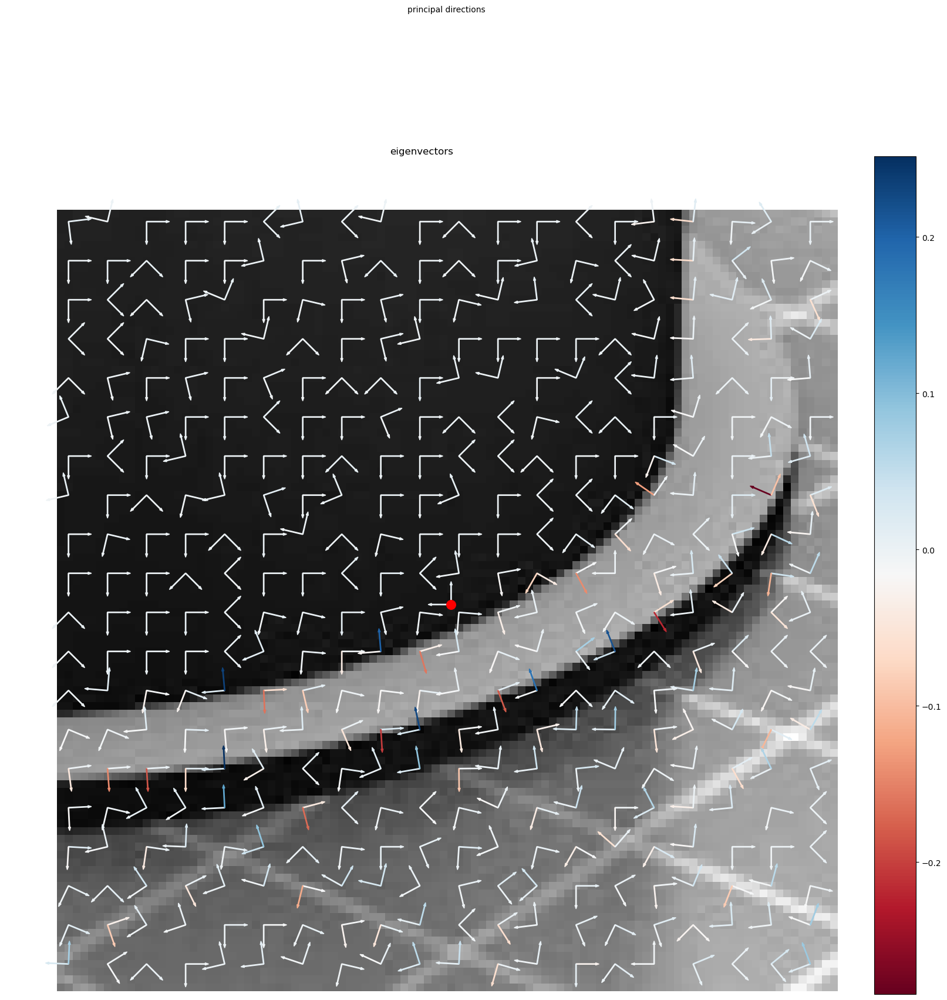

In [9]:
# create figure and ax
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

# compute eigenvectors and add them to the ax
sm = vh.visualize_curvature_directions_ax_sm(float_im1, kp1, zoom_radius, ax=ax)

# add the colorbar of the colormap of the arrows
fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)

# add legend
fig.suptitle(f"principal directions", fontsize=10)

plt.show()

Display gradients


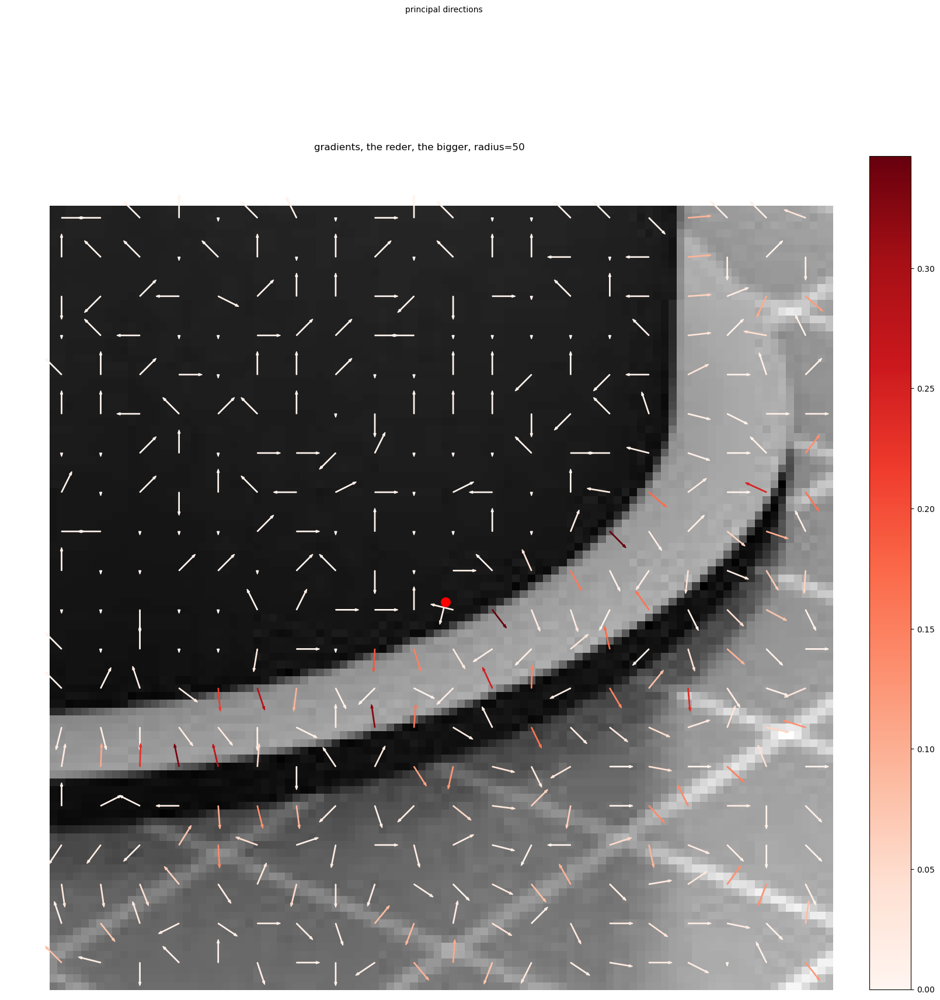

In [10]:
# create figure and ax
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

# compute eigenvectors and add them to the ax
sm = vh.visualize_gradients_ax_sm(float_im1, kp1, zoom_radius, ax=ax)

# add the colorbar of the colormap of the arrows
fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)

# add legend
fig.suptitle(f"principal directions", fontsize=10)

plt.show()

# Compute histograms descriptors of keypoints


In [11]:
kp_position1 = kp1.pt
# convert into integer
kp_position1 = np.round(kp_position1).astype(int)
kp_position1 = tuple(kp_position1)
kp_position1

(486, 464)

In [12]:
# compute overall features of a subimage of first image
border_size = 1
feature_radius = zoom_radius + 20
cropped_im1 = vh.crop_image_around_keypoint(float_im1, kp_position1, feature_radius)
overall_features = desc.compute_features_overall(cropped_im1, border_size)

zoomed_kp_position1 = (feature_radius, feature_radius)

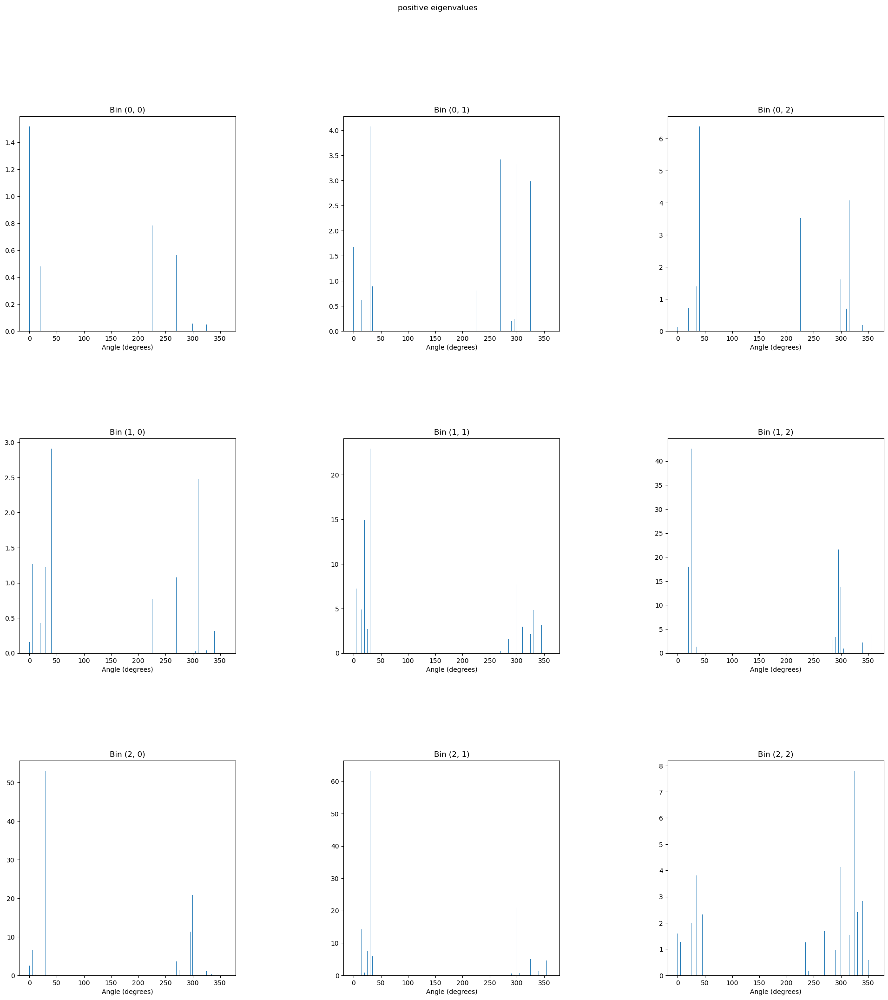

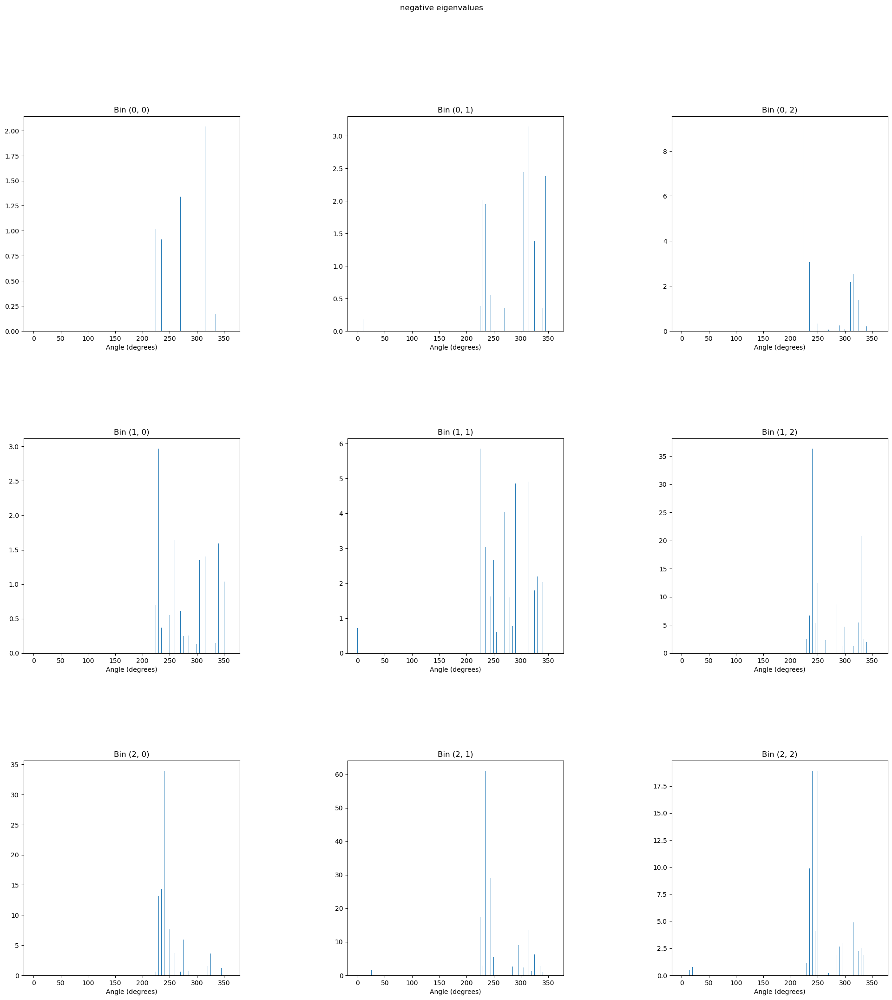

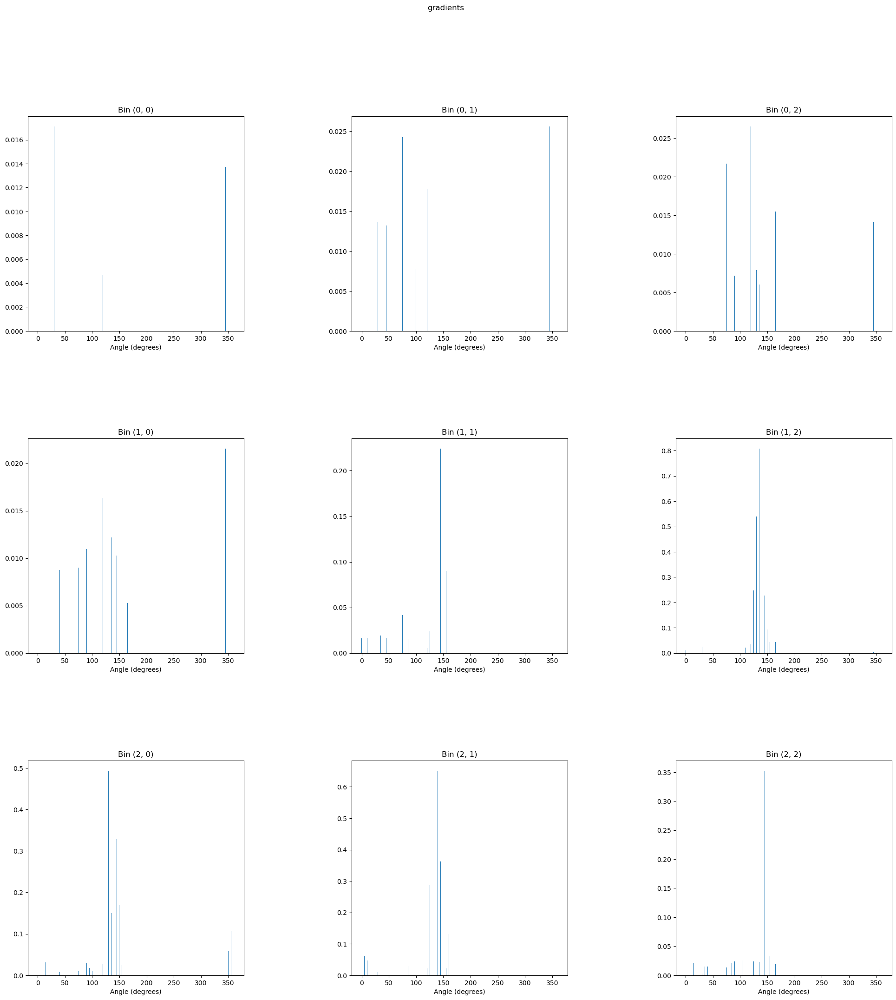

In [13]:
nb_bins = 3
bin_radius = 2
delta_angle = 5.0
sigma = 0.0

descriptor_histograms = desc.compute_descriptor_histograms(
    overall_features, zoomed_kp_position1
)



desc_title = f"descriptor, with {nb_bins} bins, bin radius: {bin_radius}, delta angle: {delta_angle}, sigma: {sigma}"

desc.display_descriptor(descriptor_histograms, desc_title)